In [3]:
import albumentations as A
import os
from PIL import Image
import cv2 as cv
import cv2
import matplotlib.pyplot as plt
import numpy

In [4]:
# This cell can be used to count the instance of single object in the provided directory containing using
# YOLO text file

# Method to read the text file in the given path. It returns the all the lines in the file
def read_text_file(file_path):
    with open(file_path, 'r') as f:
      Lines = f.readlines()
      return Lines

# Method used to count the instance of each object in the given text file.
def match_object(lines, object):
  found = 0
  for each_line in lines:
    if each_line[0] == str(object):
      found = found + 1
  
  return found

# Method to read all the text file in the given directory inorder to count the instance of given class.
def match_all(path, obj):
  count = 0
  for file in os.listdir(path):
    if file.endswith(".txt"):
      lines = read_text_file(path + "/" + file)
      found = match_object(lines, obj)
      if found != None:
        count = count + found
      
  
  return count

In [5]:
# Each instance represented by a number
cup, bottle, glass, tin_can, gym_bottle = 0, 1, 2, 3, 4

# Path of directory containing text file
path_train = "/content/tmp/data/train/labels"
path_valid = "/content/tmp/data/valid/labels"

print("Train Instances Cup:", match_all(path_train, cup))
print("Train Instances Bottle:", match_all(path_train, bottle))
print("Train Instances Glass:", match_all(path_train, glass))
print("Train Instances Tin-Can:", match_all(path_train, tin_can))
print("Train Instances Gym-Bottle:", match_all(path_train, gym_bottle))

print("")
print("Validation Instances Cup:", match_all(path_valid, cup))
print("Validation Instances Bottle:", match_all(path_valid, bottle))
print("Validation Instances Glass:", match_all(path_valid, glass))
print("Validation Instances Tin-Can:", match_all(path_valid, tin_can))
print("Validation Instances Gym-Bottle:", match_all(path_valid, gym_bottle))


Train Instances Cup: 2130
Train Instances Bottle: 4835
Train Instances Glass: 2979
Train Instances Tin-Can: 1240
Train Instances Gym-Bottle: 1468

Validation Instances Cup: 585
Validation Instances Bottle: 1221
Validation Instances Glass: 777
Validation Instances Tin-Can: 279
Validation Instances Gym-Bottle: 433


In [60]:
# This cell can be used to apply bounding box level augmentation to dataset for YOLO.

# Each instance represented by a number
cup, bottle, glass, tin_can, gym_bottle = 0, 1, 2, 3, 4

# Method to read single file in the provided path
def read_text_file(file_path):
    with open(file_path, 'r') as f:
      Lines = f.readlines()
      return Lines
    
# Method to found the given instance in the file.
def match_object(lines, object):
  found = 0
  for each_line in lines:
    if each_line[0] == str(object):
      found = found + 1
    else:
      found = 0
      return found
  return found

# Method to draw the bounding box to verify augmentation result
def draw(img, bboxes, mode):
  h,w,_ = img.shape
  for each_line in bboxes:        
    x11 = int( float(each_line.split(' ')[1]) * w )
    y11 = int( float(each_line.split(' ')[2]) * h )
    xw1 = int( float(each_line.split(' ')[3]) * w /2)
    yw1 = int( float(each_line.split(' ')[4]) * h /2)

    start_point1 = (x11 - xw1, y11 - yw1 )

    end_point1   = (x11 + xw1, y11 + yw1 )
    if mode == 1:
      ccc = cv2.rectangle(img, start_point1, end_point1, (2550, 0, 0), 3)
    else:
      ccc = cv2.rectangle(img, start_point1, end_point1, (0, 0, 255), 3)    
  plt.imshow(img)
  plt.show()

# This method convert yolo format to pascal inorder to find intersection over union (iou) for overlapping bounding box.
def yolo_to_pascal_voc(x_center, y_center, w, h,  image_w, image_h):
    w = w * image_w
    h = h * image_h
    x1 = ((2 * x_center * image_w) - w)/2
    y1 = ((2 * y_center * image_h) - h)/2
    x2 = x1 + w
    y2 = y1 + h
    return [x1, y1, x2, y2]

# This method calculates intersection over union (iou) for all the bounding boxes in a single image.
def bb_intersection_over_union(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])


    interArea = abs(max((xB - xA, 0)) * max((yB - yA), 0))
    if interArea == 0:
        return 0
    boxAArea = abs((boxA[2] - boxA[0]) * (boxA[3] - boxA[1]))
    boxBArea = abs((boxB[2] - boxB[0]) * (boxB[3] - boxB[1]))

    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou
    
# This method is used to apply the augmentation to the provided data
def augment(path, path_image, result_path, obj, obj_name, instance, write, iter):
  global max_aug 
  max_aug = 0
  for file in os.listdir(path):
    if max_aug >= instance:
      break

    elif file.endswith(".txt"):
      lines = read_text_file(path + "/" + file)
      found = match_object(lines, obj)
      if found >= 1:
        path1 = file
        path1 = path1.replace(".txt", ".jpg")
        image2 = cv.imread(path_image + "/" + path1)
        class_labels = []
        bboxes = []
        pascal = []
        for i in lines:
          int(i[0])
          result = i.split(" ")
          class_labels.append(result[0])
          l = []
          l.append(float(result[1]))
          l.append(float(result[2]))
          l.append(float(result[3]))
          l.append(float(result[4]))
          bboxes.append(l)


        try:
          transformed = transform(image=image2, bboxes=bboxes, class_labels=class_labels)
          
          transformed_image = transformed['image']
          transformed_bboxes = transformed['bboxes']
          transformed_class_labels = transformed['class_labels']

          if write == False:
            draw(image2, lines, 1)

          count = 0
          h,w,_ = transformed_image.shape
          trans_lines = []
          result_bboxes = []
          overlapped, show = overlap_check(transformed_bboxes, transformed_image)
          for each_line in transformed_bboxes:
            result_bboxes.append(list(each_line))
            s = ""
            s = s + str(class_labels[count]) + " "
            count += 1
            for i in each_line:
              s = s + str(i) + " "
          
            position = len(s) - 1
            new_character = '\n'
            s = s[:position] + new_character + s[position+1:]
            
            if write == True and overlapped == False:
              f = open(result_path + "/" + "labels" + "/" + iter + file, "a")
              f.write(s)
              f.close()  
            trans_lines.append(s)
          if write == False:
            print(show)
            max_aug += found
            draw(transformed_image, trans_lines, 0)
          elif overlapped == False and write == True:
            max_aug += found
            cv2.imwrite(result_path + "/" + "images" + "/" + iter + path1, transformed_image)
     
        except:
          pass

  return max_aug

# Thid method check all the images one by one if their bounding boxes overlap or not.
def overlap_check(transformed_bbox, img):
    greater = False
    over = ""
    to_pascal = []
    for i in transformed_bbox:
        to_pascal.append(yolo_to_pascal_voc(i[0], i[1], i[2], i[3], img.shape[1], img.shape[0]))
    
    if len(to_pascal) > 1:
        for i in to_pascal:
            to_pascal.remove(i)
            for j in to_pascal:
                iou = bb_intersection_over_union(boxA=i, boxB=j)
                if iou > 0.12:
                   over = "Overlapping Bounding Box. Augmentation Rejected!"
                   greater = True
    return greater, over

In [84]:
prob = 0.5
brightness = 0.2
contrast_limit = 0.2
blur_x, blur_y = 7,7
transform = A.Compose([
                       A.GaussianBlur(blur_limit=(blur_x, blur_y), p=prob, always_apply= True),
                       A.ShiftScaleRotate(rotate_limit=(25,35), p=1),
                       A.RandomBrightnessContrast(brightness_limit=brightness, contrast_limit=contrast_limit, p=prob),
], bbox_params=A.BboxParams(format='yolo', min_area=1024, min_visibility=0.3, label_fields=['class_labels']))

In [85]:
path_train_labels = "C:/content/tmp/data/train/labels"
path_train_images = "C:/content/tmp/data/train/images"
save_result_path = "C:/Users/Muhammad Waleed/Downloads/result/train"

try:
    os.mkdir(save_result_path + "/images")
    os.mkdir(save_result_path + "/labels")
except:
    pass

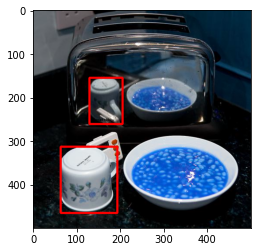

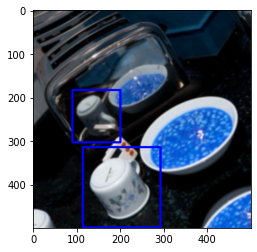

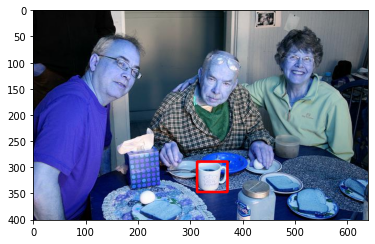

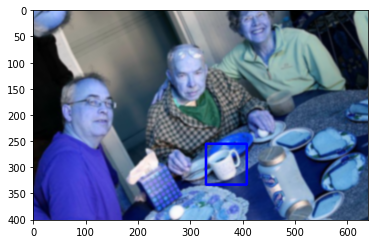

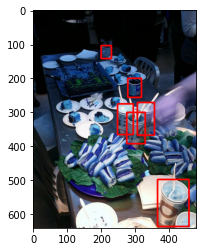

Overlapping Bounding Box. Augmentation Rejected!


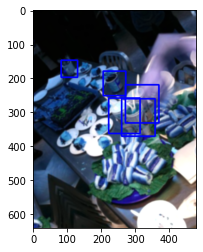

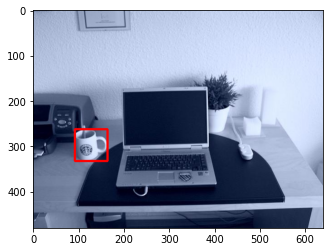

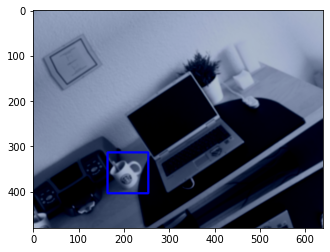

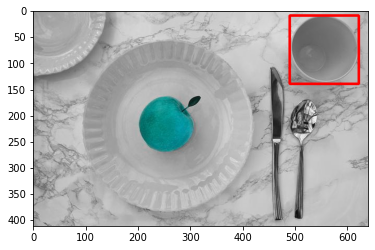

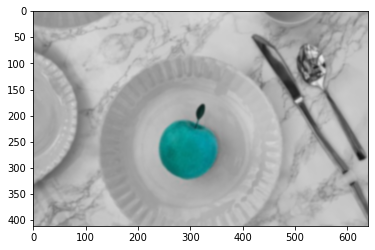

...

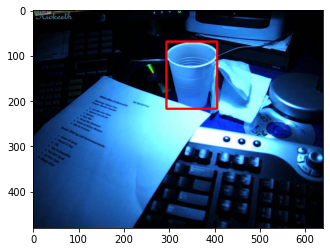

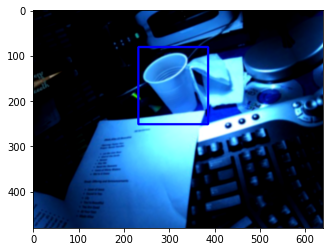

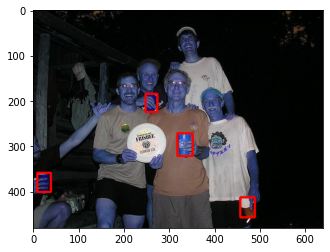

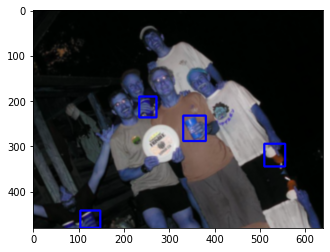

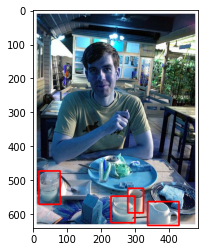

Overlapping Bounding Box. Augmentation Rejected!


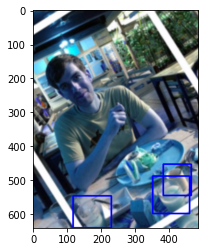

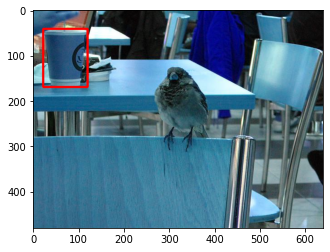

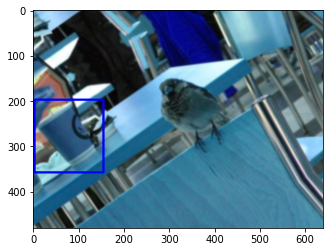

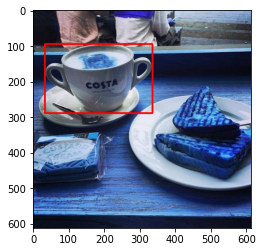

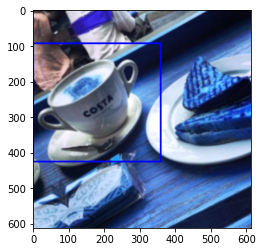

...

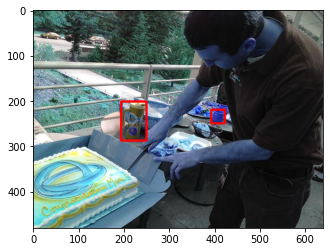

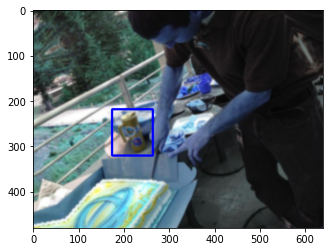

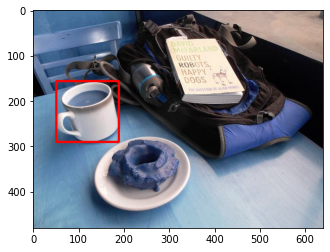

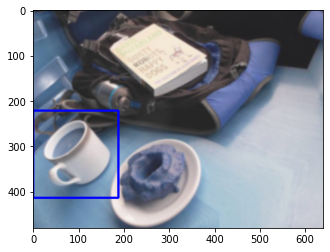

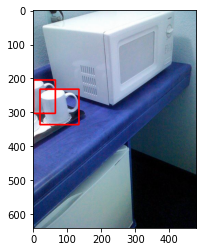

Overlapping Bounding Box. Augmentation Rejected!


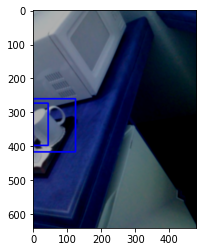

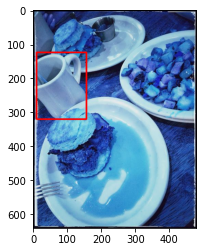

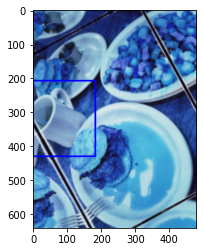

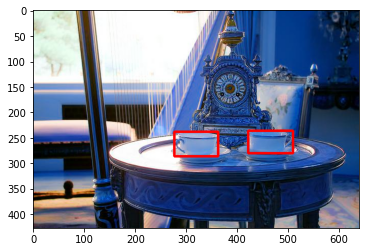

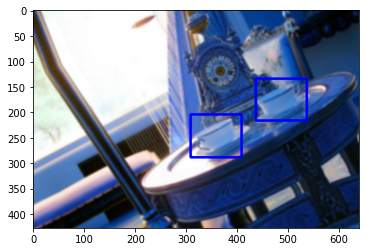

...

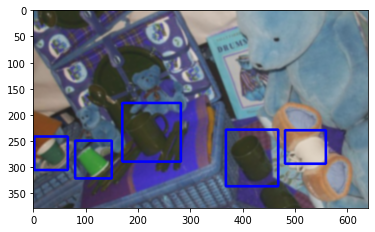

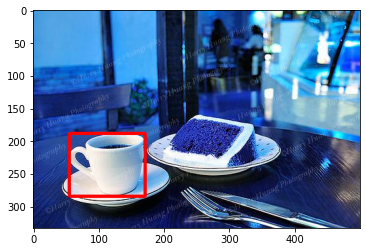

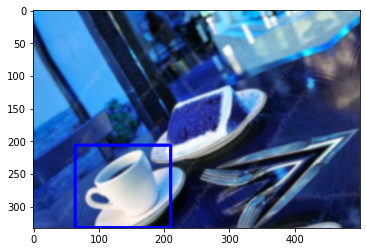

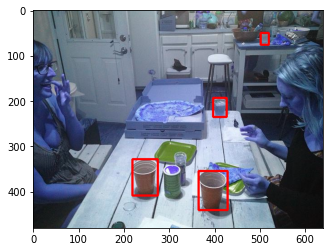

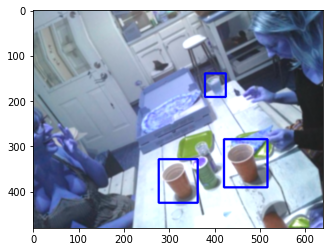

103

In [87]:
# write: If Flase the Augmentation will display results only, If True the Augmentation will be saved in directory
write = True
obj = cup


augment(path_train_labels, path_train_images, save_result_path, obj , "", 100, write= write, iter="")

In [39]:
path_train = "C:/Users/Muhammad Waleed/Downloads/result/train/labels"

print("Train Instances Cup:", match_all(path_train, cup))
print("Train Instances Bottle:", match_all(path_train, bottle))
print("Train Instances Glass:", match_all(path_train, glass))
print("Train Instances Tin-Can:", match_all(path_train, tin_can))
print("Train Instances Gym-Bottle:", match_all(path_train, gym_bottle))

Train Instances Cup: 0
Train Instances Bottle: 100
Train Instances Glass: 0
Train Instances Tin-Can: 0
Train Instances Gym-Bottle: 0
